# DALL·E mini - Proof of Concept

## Installation and set-up

In [1]:
# Install required libraries
!pip install -q dalle-mini
!pip install -q git+https://github.com/patil-suraj/vqgan-jax.git

We load required models:
* DALL·E mini for text to encoded images
* VQGAN for decoding images
* CLIP for scoring predictions

In [6]:
# Model references

# dalle-mega
#DALLE_MODEL = "dalle-mini/dalle-mini/mega-1-fp16:latest"  # can be wandb artifact or 🤗 Hub or local folder or google bucket
DALLE_COMMIT_ID = None

# if the notebook crashes too often you can use dalle-mini instead by uncommenting below line
#DALLE_MODEL = "dalle-mini/dalle-mini/mini-1:latest"
DALLE_MODEL = "dalle-mini/dalle-mini/mega-1:latest"

# VQGAN model
VQGAN_REPO = "dalle-mini/vqgan_imagenet_f16_16384"
VQGAN_COMMIT_ID = "e93a26e7707683d349bf5d5c41c5b0ef69b677a9"

In [2]:
import jax
import jax.numpy as jnp

# check how many devices are available
jax.local_device_count()

1

In [7]:
# Load models & tokenizer
from dalle_mini import DalleBart, DalleBartProcessor
from vqgan_jax.modeling_flax_vqgan import VQModel
from transformers import CLIPProcessor, FlaxCLIPModel

# Load dalle-mini
model, params = DalleBart.from_pretrained(
    DALLE_MODEL, revision=DALLE_COMMIT_ID, dtype=jnp.float32, _do_init=False
)

# Load VQGAN
vqgan, vqgan_params = VQModel.from_pretrained(
    VQGAN_REPO, revision=VQGAN_COMMIT_ID, _do_init=False
)

wandb: Downloading large artifact mega-1:latest, 9873.84MB. 7 files... 
wandb:   7 of 7 files downloaded.  
Done. 0:0:28.4


Model parameters are replicated on each device for faster inference.

In [8]:
from flax.jax_utils import replicate

params = replicate(params)
vqgan_params = replicate(vqgan_params)

Model functions are compiled and parallelized to take advantage of multiple devices.

In [9]:
from functools import partial

# model inference
@partial(jax.pmap, axis_name="batch", static_broadcasted_argnums=(3, 4, 5, 6))
def p_generate(
    tokenized_prompt, key, params, top_k, top_p, temperature, condition_scale
):
    return model.generate(
        **tokenized_prompt,
        prng_key=key,
        params=params,
        top_k=top_k,
        top_p=top_p,
        temperature=temperature,
        condition_scale=condition_scale,
    )


# decode image
@partial(jax.pmap, axis_name="batch")
def p_decode(indices, params):
    return vqgan.decode_code(indices, params=params)

Keys are passed to the model on each device to generate unique inference per device.

In [10]:
import random

# create a random key
seed = random.randint(0, 2**32 - 1)
key = jax.random.PRNGKey(seed)

## Text Prompts

In [11]:
from dalle_mini import DalleBartProcessor

processor = DalleBartProcessor.from_pretrained(DALLE_MODEL, revision=DALLE_COMMIT_ID)

wandb: Downloading large artifact mega-1:latest, 9873.84MB. 7 files... 
wandb:   7 of 7 files downloaded.  
Done. 0:0:29.0


In [12]:
# Generate all prompts
shapes = ["heart", "square", "triangle", "circle", "pentagon", "star"]
colors = ["blue", "green", "yellow", "red", "black","white"]
prompts = []
for i in shapes:
  for j in colors:
    colors_copy = colors.copy()
    new_colors = colors_copy.pop(colors.index(j))
    for k in colors_copy:
      prompts.append("{} {} on {} background".format(j,i,k))
print(prompts)
print(len(prompts))

['blue heart on green background', 'blue heart on yellow background', 'blue heart on red background', 'blue heart on black background', 'blue heart on white background', 'green heart on blue background', 'green heart on yellow background', 'green heart on red background', 'green heart on black background', 'green heart on white background', 'yellow heart on blue background', 'yellow heart on green background', 'yellow heart on red background', 'yellow heart on black background', 'yellow heart on white background', 'red heart on blue background', 'red heart on green background', 'red heart on yellow background', 'red heart on black background', 'red heart on white background', 'black heart on blue background', 'black heart on green background', 'black heart on yellow background', 'black heart on red background', 'black heart on white background', 'white heart on blue background', 'white heart on green background', 'white heart on yellow background', 'white heart on red background', 'whi

In [18]:
# function to split a list into batches of n elements
def batch_paths(iterable, n=1):
    l = len(iterable)
    list_b = []
    for ndx in range(0, l, n):
        list_b.append(iterable[ndx:min(ndx + n, l)])
    return list_b

Finally we replicate the prompts onto each device.

In [14]:
import numpy as np

# load devices
devices = jax.local_devices()

# tokenize the prompts
tokenized_prompts = processor(prompts)
tokenized_prompt = replicate(tokenized_prompts)

# break down dictionary and squeeze to reduce dimension by 1
attention_mask = np.squeeze(tokenized_prompt['attention_mask'])
attention_mask_uncond = np.squeeze(tokenized_prompt['attention_mask_uncond'])
input_ids = np.squeeze(tokenized_prompt['input_ids'])
input_ids_uncond = np.squeeze(tokenized_prompt['input_ids_uncond'])

# split arrays into 36 batches of 5
batches_attention_mask = jax.numpy.split(attention_mask, 36, axis=0)
batches_attention_mask_uncond = jax.numpy.split(attention_mask_uncond, 36, axis=0)
batches_input_ids = jax.numpy.split(input_ids, 36, axis=0)
batches_input_ids_uncond = jax.numpy.split(input_ids_uncond, 36, axis=0)
print(len(batches_attention_mask[0]))

# put dictionary of dimensions (1, 36, 64) back together 
batches = []
for i in range(36):
  new_prompts = {'attention_mask':jax.device_put_sharded([batches_attention_mask[i]], devices), 'attention_mask_uncond':jax.device_put_sharded([batches_attention_mask_uncond[i]], devices), 'input_ids':jax.device_put_sharded([batches_input_ids[i]], devices), 'input_ids_uncond':jax.device_put_sharded([batches_input_ids_uncond[i]], devices)}
  batches.append(new_prompts)


5


## Generate images

We generate images using dalle-mini model and decode them with the VQGAN.

In [15]:
# number of predictions per prompt
n_predictions = 1

# We can customize generation parameters (see https://huggingface.co/blog/how-to-generate)
gen_top_k = None
gen_top_p = None
temperature = None
cond_scale = 10.0

In [16]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


[['blue_heart_on_green_background', 'blue_heart_on_yellow_background', 'blue_heart_on_red_background', 'blue_heart_on_black_background', 'blue_heart_on_white_background'], ['green_heart_on_blue_background', 'green_heart_on_yellow_background', 'green_heart_on_red_background', 'green_heart_on_black_background', 'green_heart_on_white_background'], ['yellow_heart_on_blue_background', 'yellow_heart_on_green_background', 'yellow_heart_on_red_background', 'yellow_heart_on_black_background', 'yellow_heart_on_white_background'], ['red_heart_on_blue_background', 'red_heart_on_green_background', 'red_heart_on_yellow_background', 'red_heart_on_black_background', 'red_heart_on_white_background'], ['black_heart_on_blue_background', 'black_heart_on_green_background', 'black_heart_on_yellow_background', 'black_heart_on_red_background', 'black_heart_on_white_background'], ['white_heart_on_blue_background', 'white_heart_on_green_background', 'white_heart_on_yellow_background', 'white_heart_on_red_backgr

  0%|          | 0/1 [00:00<?, ?it/s]

['blue_heart_on_green_background', 'blue_heart_on_yellow_background', 'blue_heart_on_red_background', 'blue_heart_on_black_background', 'blue_heart_on_white_background']


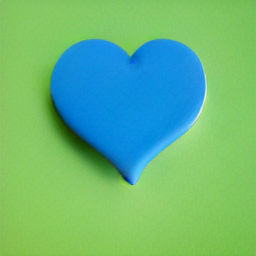

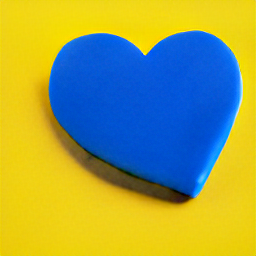

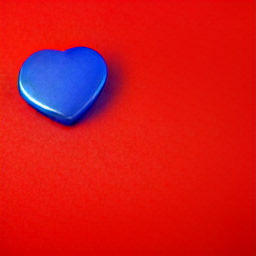

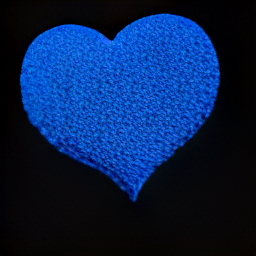

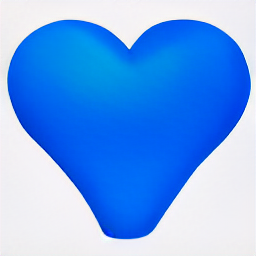

['green_heart_on_blue_background', 'green_heart_on_yellow_background', 'green_heart_on_red_background', 'green_heart_on_black_background', 'green_heart_on_white_background']


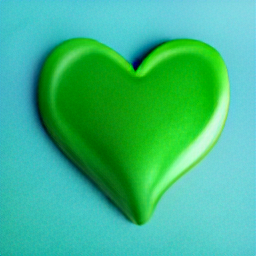

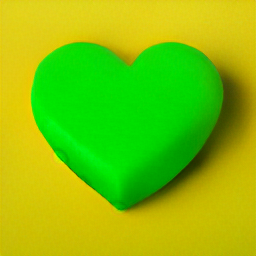

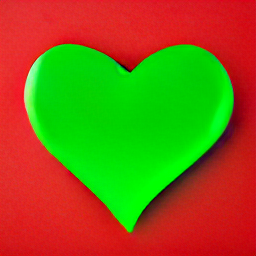

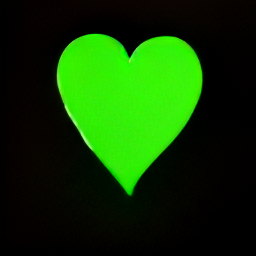

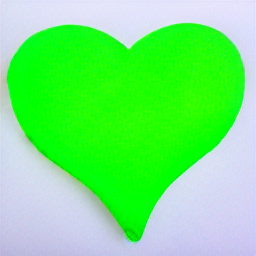

['yellow_heart_on_blue_background', 'yellow_heart_on_green_background', 'yellow_heart_on_red_background', 'yellow_heart_on_black_background', 'yellow_heart_on_white_background']


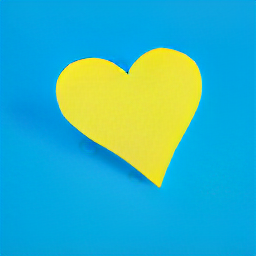

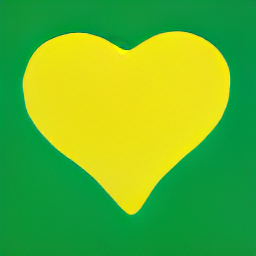

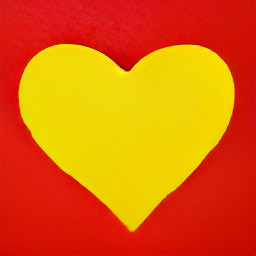

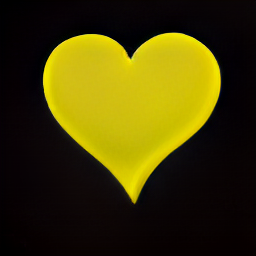

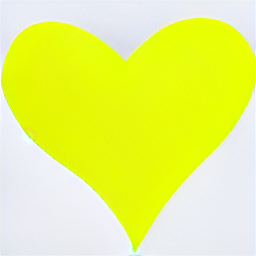

['red_heart_on_blue_background', 'red_heart_on_green_background', 'red_heart_on_yellow_background', 'red_heart_on_black_background', 'red_heart_on_white_background']


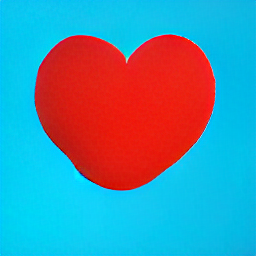

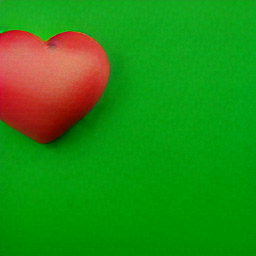

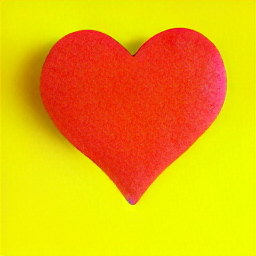

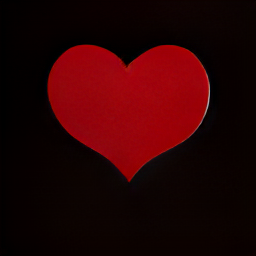

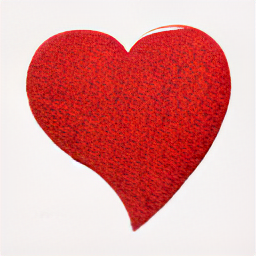

['black_heart_on_blue_background', 'black_heart_on_green_background', 'black_heart_on_yellow_background', 'black_heart_on_red_background', 'black_heart_on_white_background']


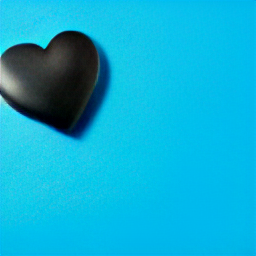

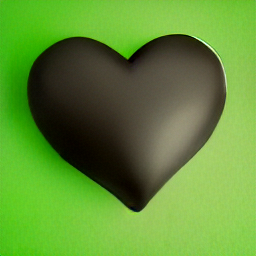

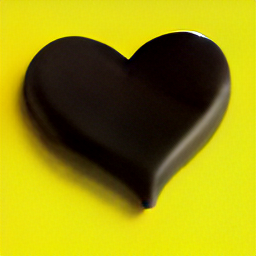

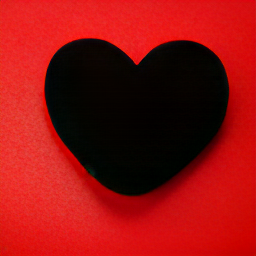

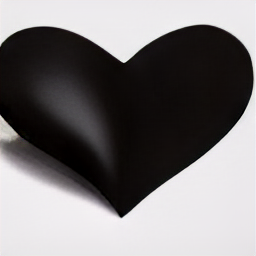

['white_heart_on_blue_background', 'white_heart_on_green_background', 'white_heart_on_yellow_background', 'white_heart_on_red_background', 'white_heart_on_black_background']


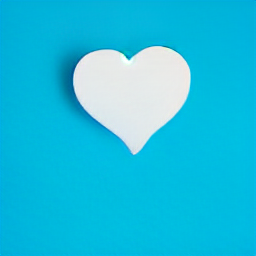

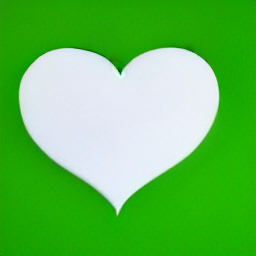

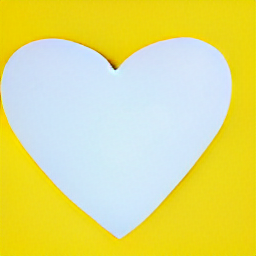

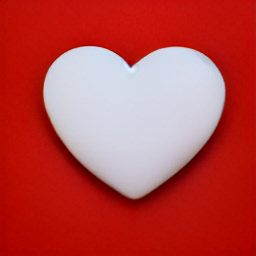

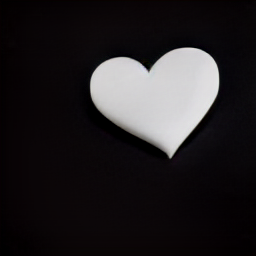

['blue_square_on_green_background', 'blue_square_on_yellow_background', 'blue_square_on_red_background', 'blue_square_on_black_background', 'blue_square_on_white_background']


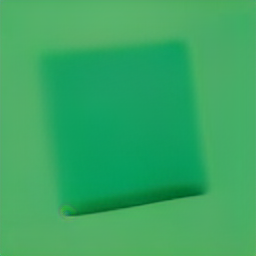

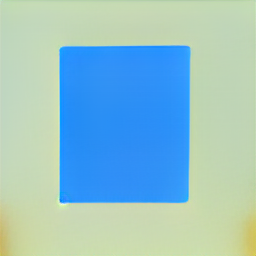

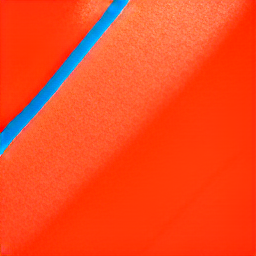

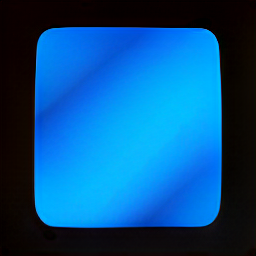

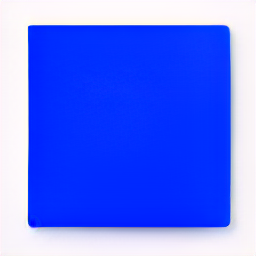

['green_square_on_blue_background', 'green_square_on_yellow_background', 'green_square_on_red_background', 'green_square_on_black_background', 'green_square_on_white_background']


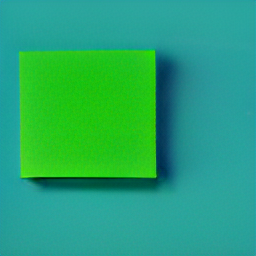

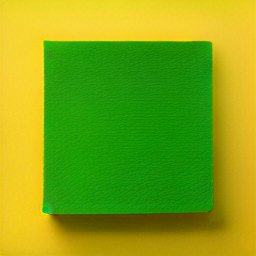

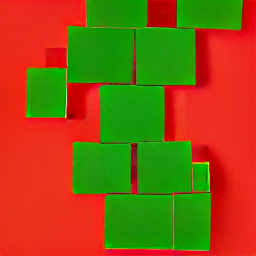

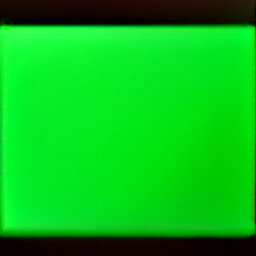

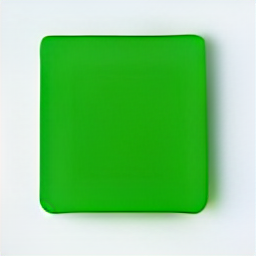

['yellow_square_on_blue_background', 'yellow_square_on_green_background', 'yellow_square_on_red_background', 'yellow_square_on_black_background', 'yellow_square_on_white_background']


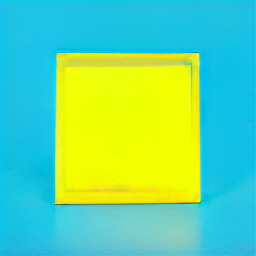

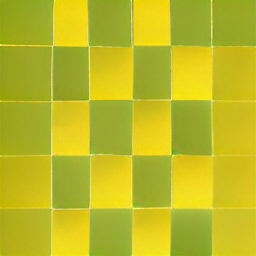

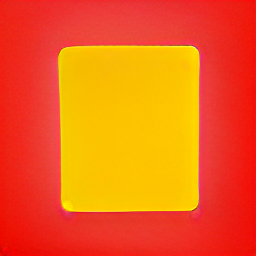

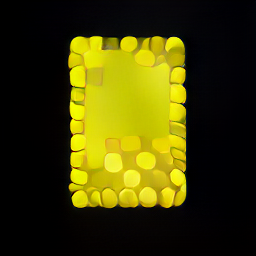

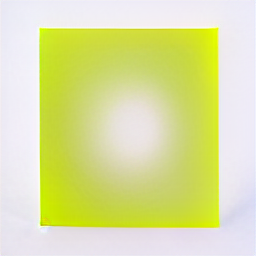

['red_square_on_blue_background', 'red_square_on_green_background', 'red_square_on_yellow_background', 'red_square_on_black_background', 'red_square_on_white_background']


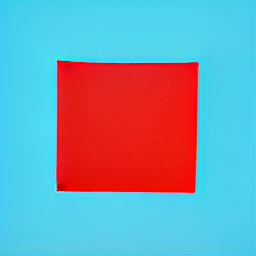

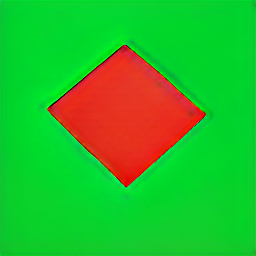

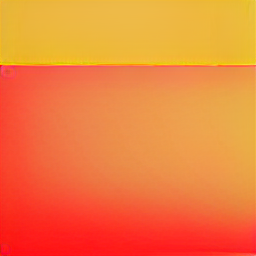

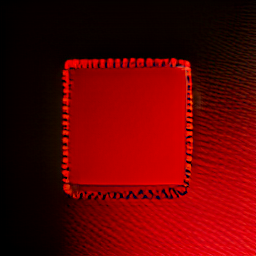

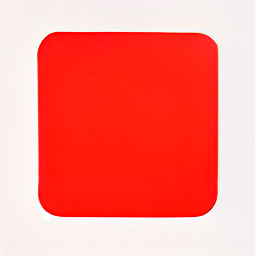

['black_square_on_blue_background', 'black_square_on_green_background', 'black_square_on_yellow_background', 'black_square_on_red_background', 'black_square_on_white_background']


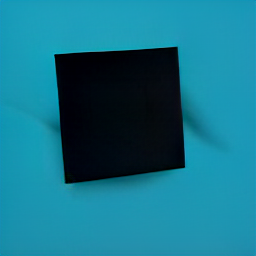

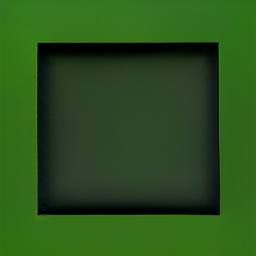

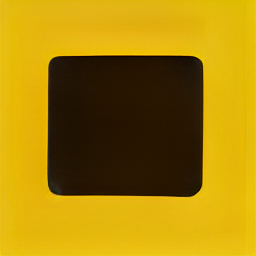

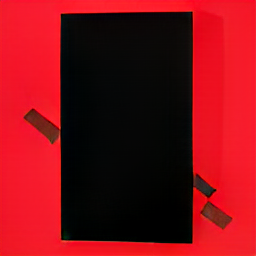

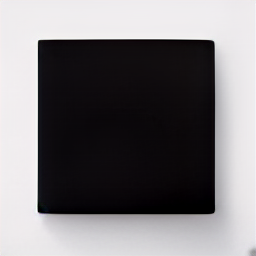

['white_square_on_blue_background', 'white_square_on_green_background', 'white_square_on_yellow_background', 'white_square_on_red_background', 'white_square_on_black_background']


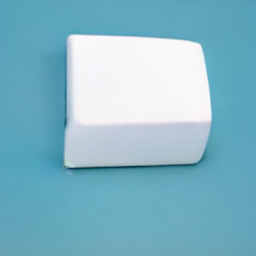

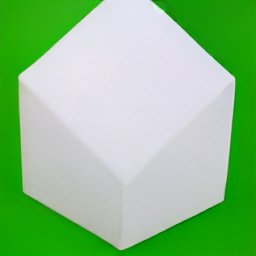

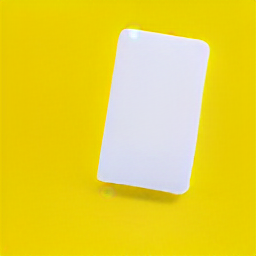

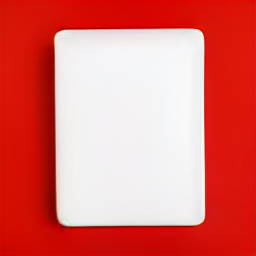

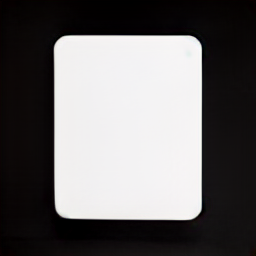

['blue_triangle_on_green_background', 'blue_triangle_on_yellow_background', 'blue_triangle_on_red_background', 'blue_triangle_on_black_background', 'blue_triangle_on_white_background']


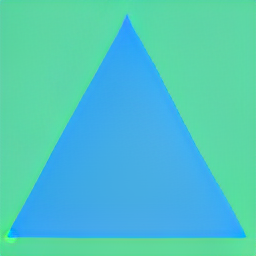

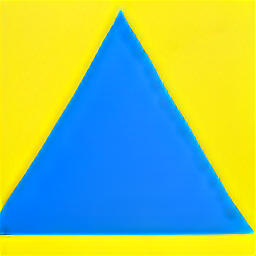

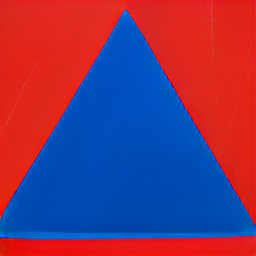

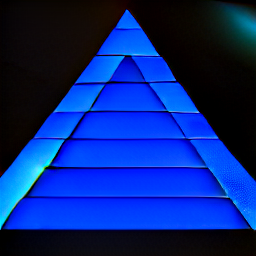

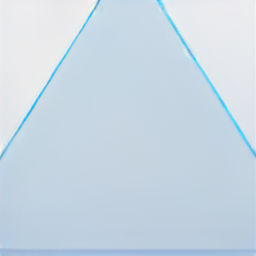

['green_triangle_on_blue_background', 'green_triangle_on_yellow_background', 'green_triangle_on_red_background', 'green_triangle_on_black_background', 'green_triangle_on_white_background']


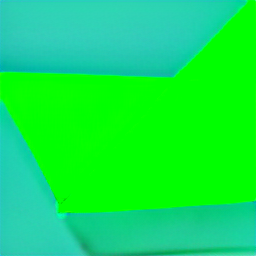

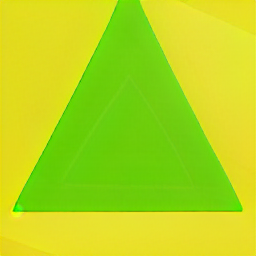

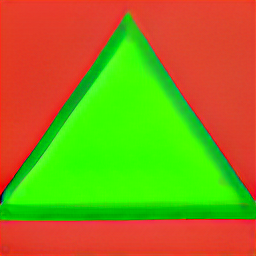

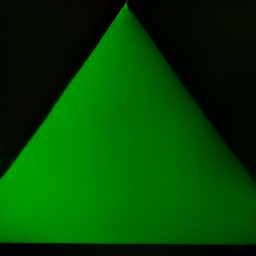

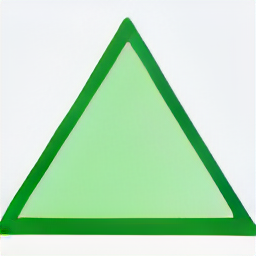

['yellow_triangle_on_blue_background', 'yellow_triangle_on_green_background', 'yellow_triangle_on_red_background', 'yellow_triangle_on_black_background', 'yellow_triangle_on_white_background']


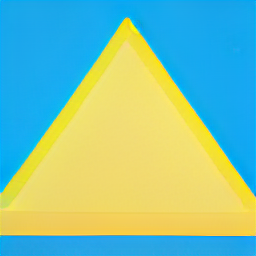

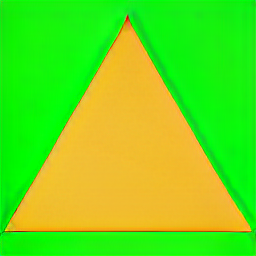

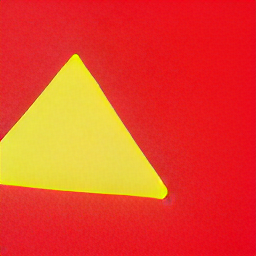

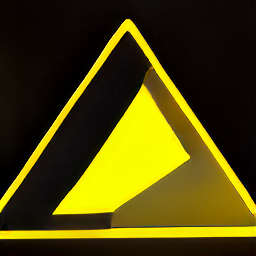

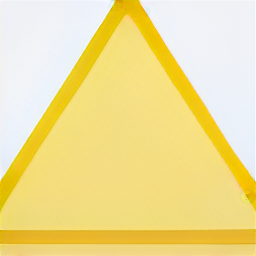

['red_triangle_on_blue_background', 'red_triangle_on_green_background', 'red_triangle_on_yellow_background', 'red_triangle_on_black_background', 'red_triangle_on_white_background']


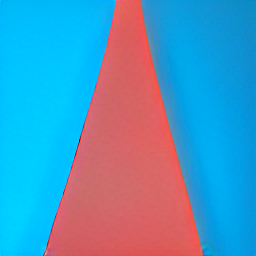

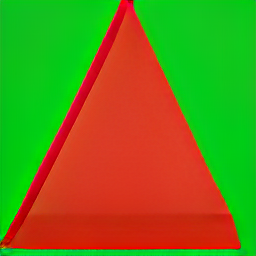

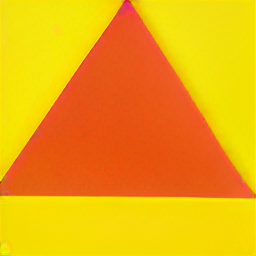

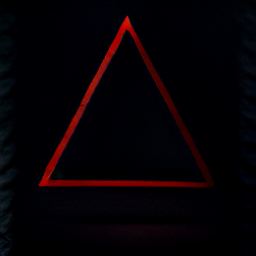

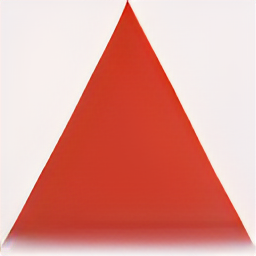

['black_triangle_on_blue_background', 'black_triangle_on_green_background', 'black_triangle_on_yellow_background', 'black_triangle_on_red_background', 'black_triangle_on_white_background']


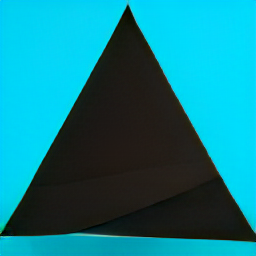

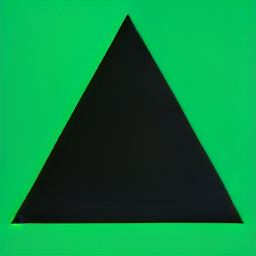

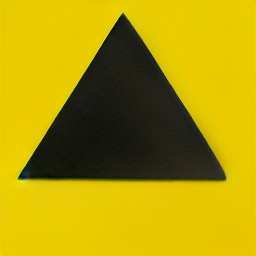

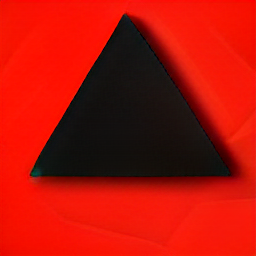

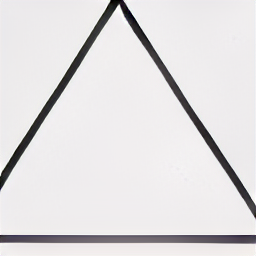

['white_triangle_on_blue_background', 'white_triangle_on_green_background', 'white_triangle_on_yellow_background', 'white_triangle_on_red_background', 'white_triangle_on_black_background']


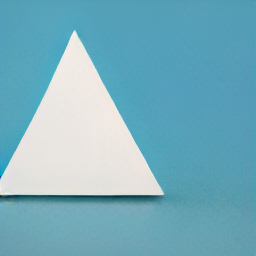

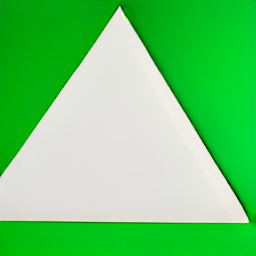

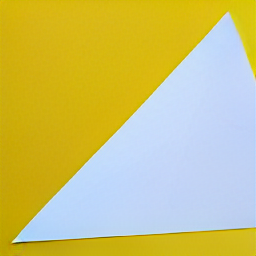

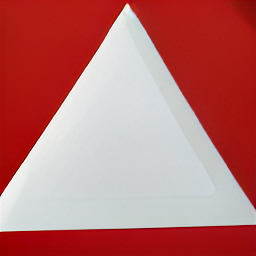

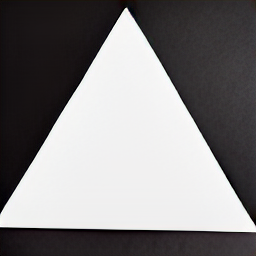

['blue_circle_on_green_background', 'blue_circle_on_yellow_background', 'blue_circle_on_red_background', 'blue_circle_on_black_background', 'blue_circle_on_white_background']


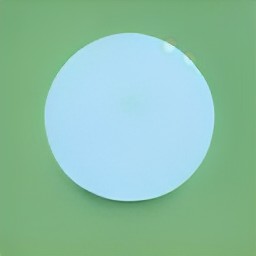

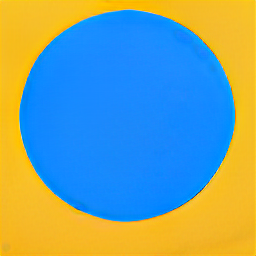

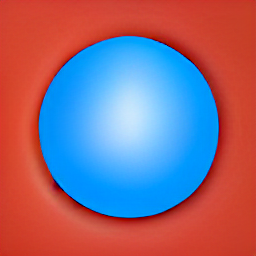

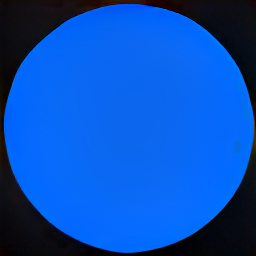

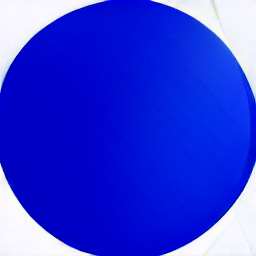

['green_circle_on_blue_background', 'green_circle_on_yellow_background', 'green_circle_on_red_background', 'green_circle_on_black_background', 'green_circle_on_white_background']


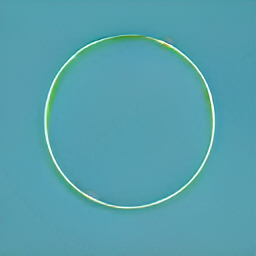

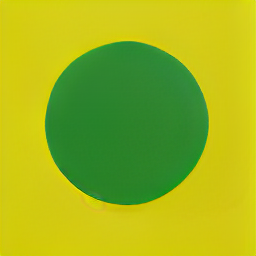

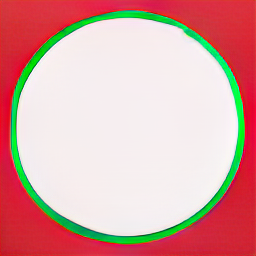

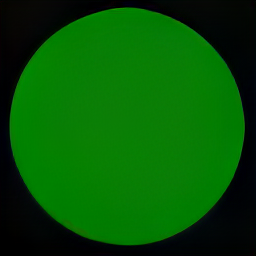

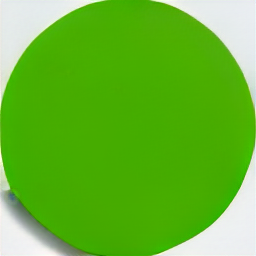

['yellow_circle_on_blue_background', 'yellow_circle_on_green_background', 'yellow_circle_on_red_background', 'yellow_circle_on_black_background', 'yellow_circle_on_white_background']


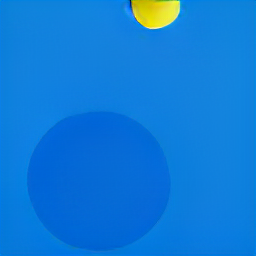

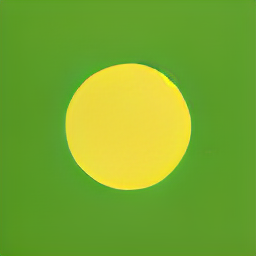

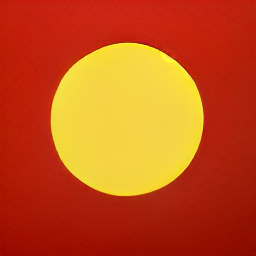

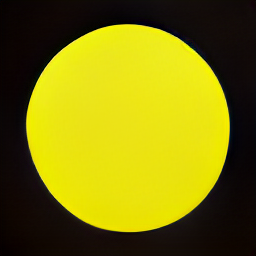

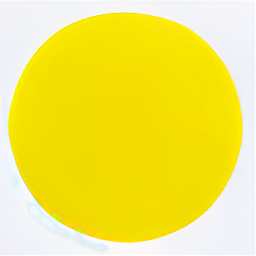

['red_circle_on_blue_background', 'red_circle_on_green_background', 'red_circle_on_yellow_background', 'red_circle_on_black_background', 'red_circle_on_white_background']


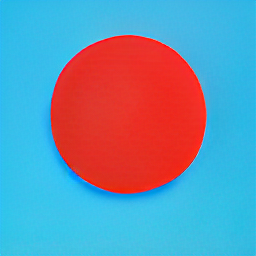

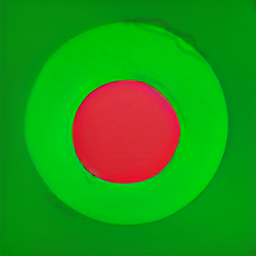

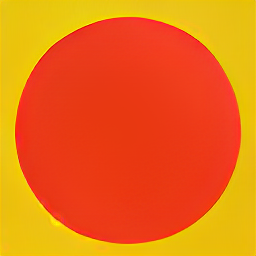

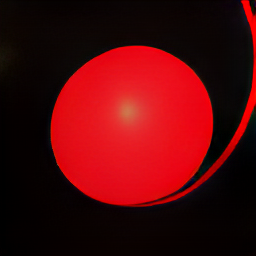

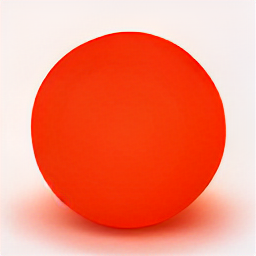

['black_circle_on_blue_background', 'black_circle_on_green_background', 'black_circle_on_yellow_background', 'black_circle_on_red_background', 'black_circle_on_white_background']


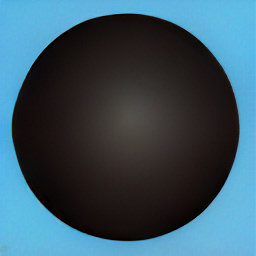

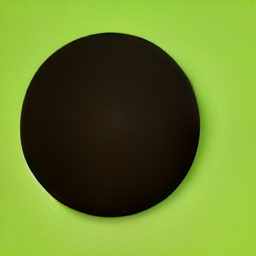

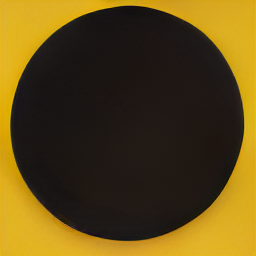

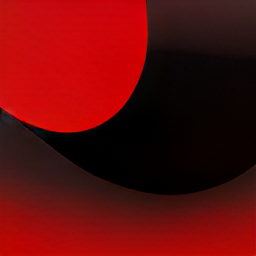

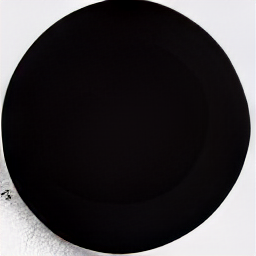

['white_circle_on_blue_background', 'white_circle_on_green_background', 'white_circle_on_yellow_background', 'white_circle_on_red_background', 'white_circle_on_black_background']


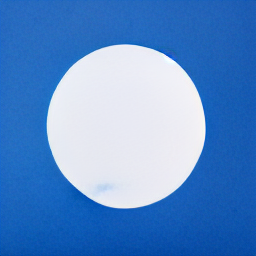

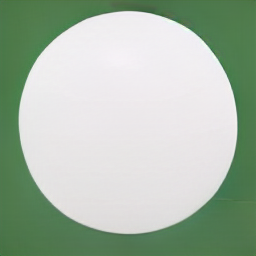

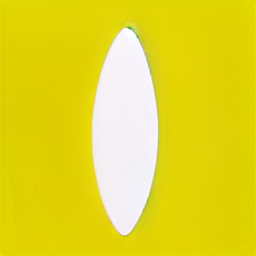

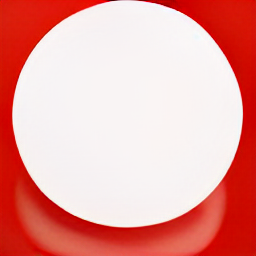

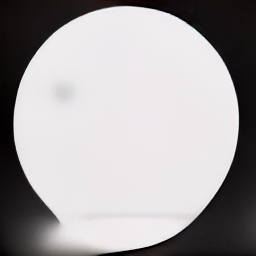

['blue_pentagon_on_green_background', 'blue_pentagon_on_yellow_background', 'blue_pentagon_on_red_background', 'blue_pentagon_on_black_background', 'blue_pentagon_on_white_background']


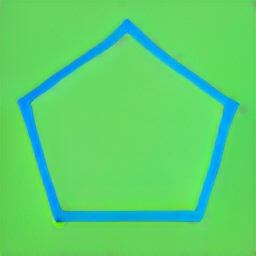

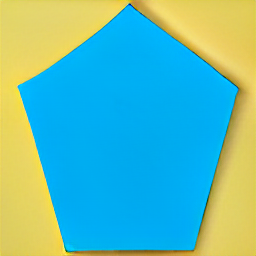

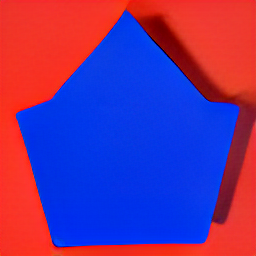

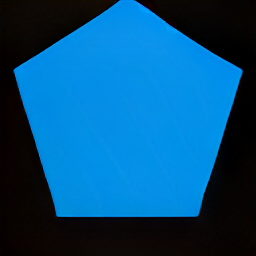

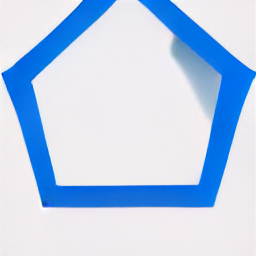

['green_pentagon_on_blue_background', 'green_pentagon_on_yellow_background', 'green_pentagon_on_red_background', 'green_pentagon_on_black_background', 'green_pentagon_on_white_background']


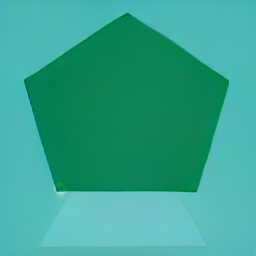

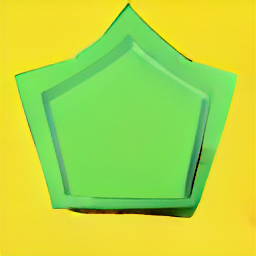

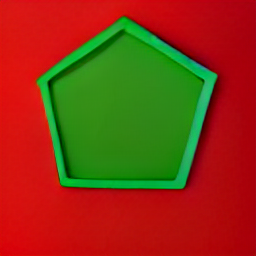

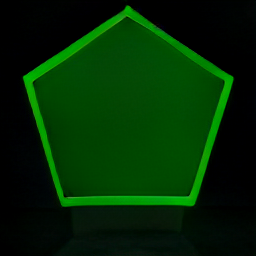

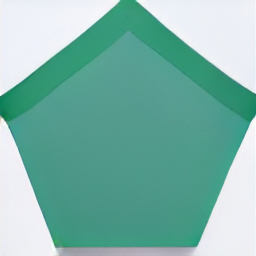

['yellow_pentagon_on_blue_background', 'yellow_pentagon_on_green_background', 'yellow_pentagon_on_red_background', 'yellow_pentagon_on_black_background', 'yellow_pentagon_on_white_background']


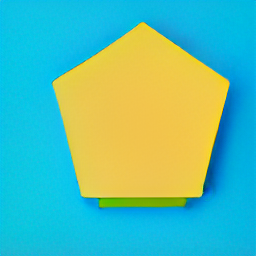

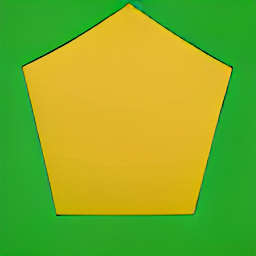

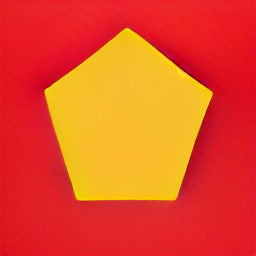

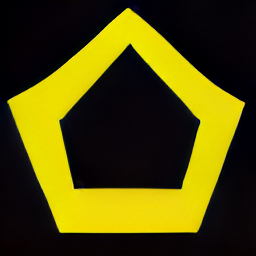

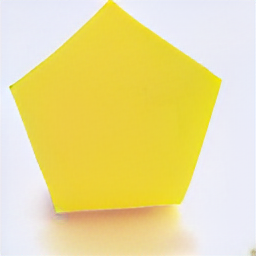

['red_pentagon_on_blue_background', 'red_pentagon_on_green_background', 'red_pentagon_on_yellow_background', 'red_pentagon_on_black_background', 'red_pentagon_on_white_background']


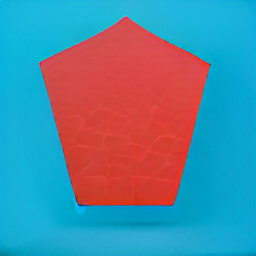

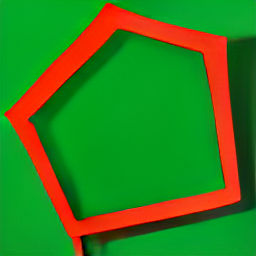

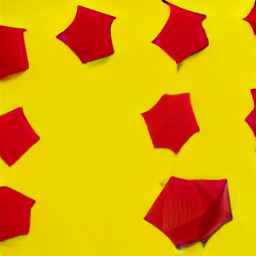

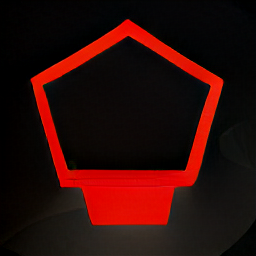

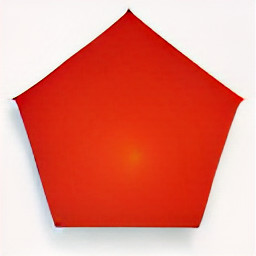

['black_pentagon_on_blue_background', 'black_pentagon_on_green_background', 'black_pentagon_on_yellow_background', 'black_pentagon_on_red_background', 'black_pentagon_on_white_background']


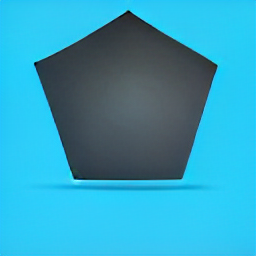

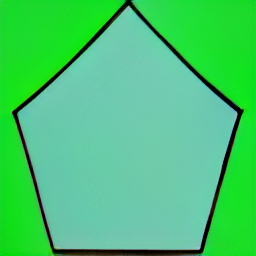

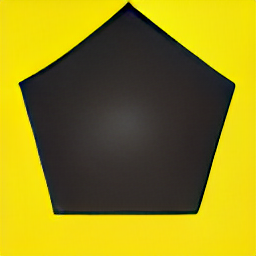

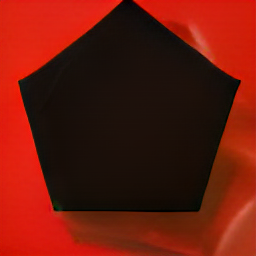

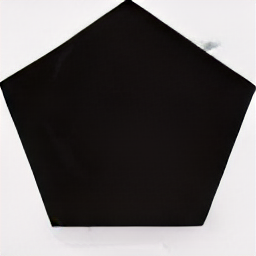

['white_pentagon_on_blue_background', 'white_pentagon_on_green_background', 'white_pentagon_on_yellow_background', 'white_pentagon_on_red_background', 'white_pentagon_on_black_background']


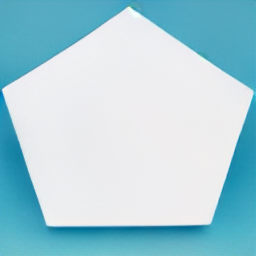

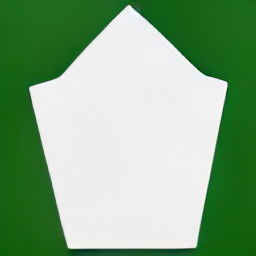

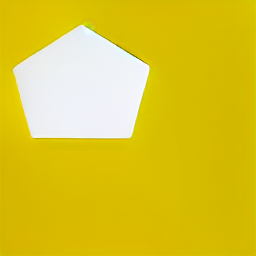

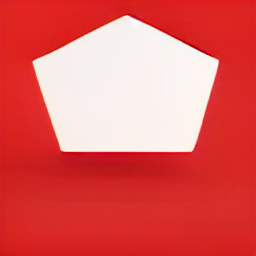

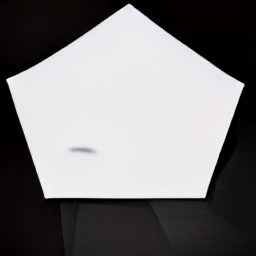

['blue_star_on_green_background', 'blue_star_on_yellow_background', 'blue_star_on_red_background', 'blue_star_on_black_background', 'blue_star_on_white_background']


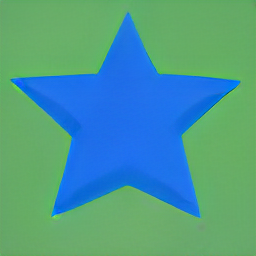

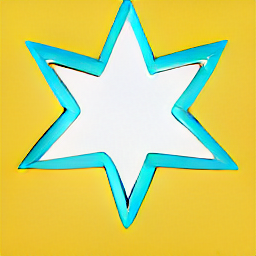

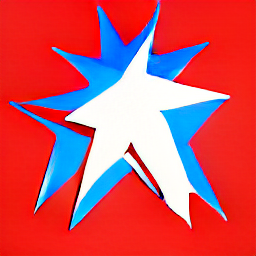

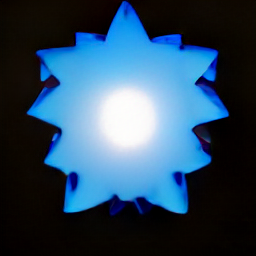

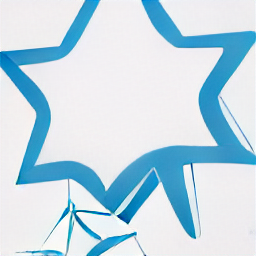

['green_star_on_blue_background', 'green_star_on_yellow_background', 'green_star_on_red_background', 'green_star_on_black_background', 'green_star_on_white_background']


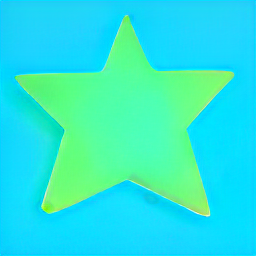

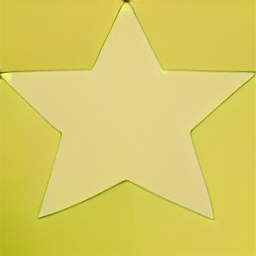

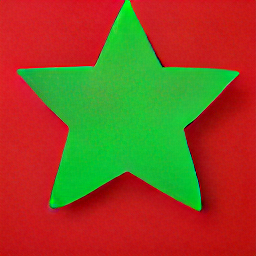

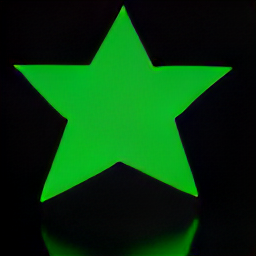

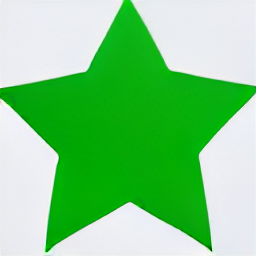

['yellow_star_on_blue_background', 'yellow_star_on_green_background', 'yellow_star_on_red_background', 'yellow_star_on_black_background', 'yellow_star_on_white_background']


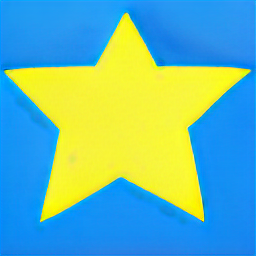

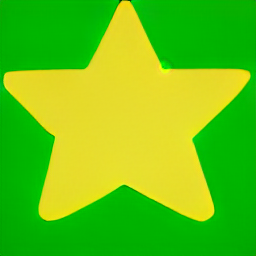

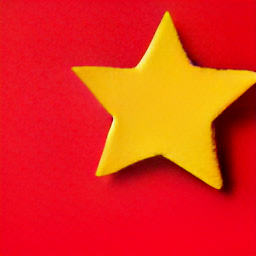

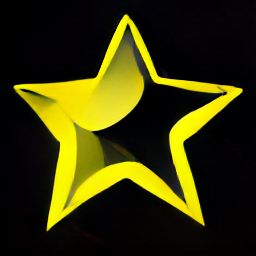

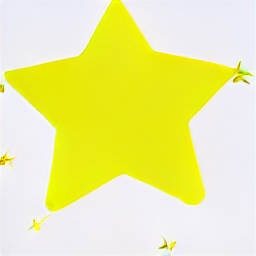

['red_star_on_blue_background', 'red_star_on_green_background', 'red_star_on_yellow_background', 'red_star_on_black_background', 'red_star_on_white_background']


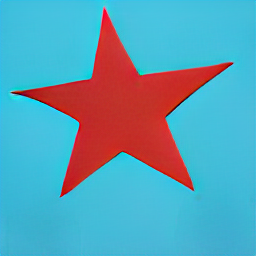

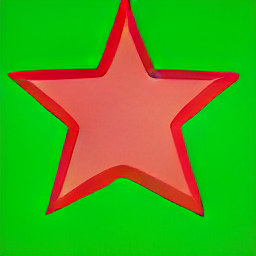

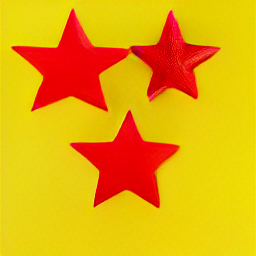

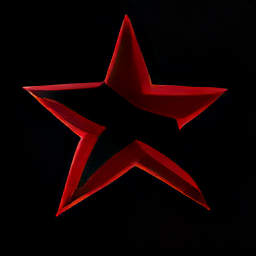

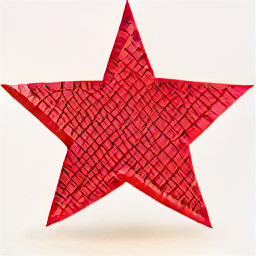

['black_star_on_blue_background', 'black_star_on_green_background', 'black_star_on_yellow_background', 'black_star_on_red_background', 'black_star_on_white_background']


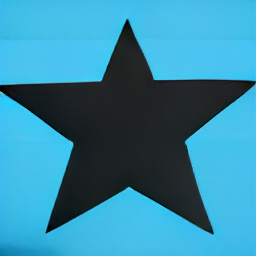

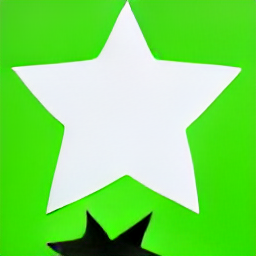

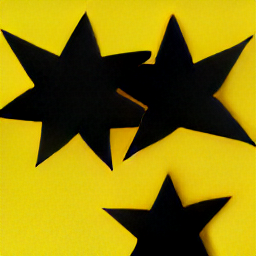

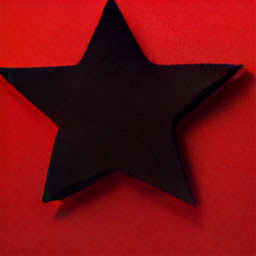

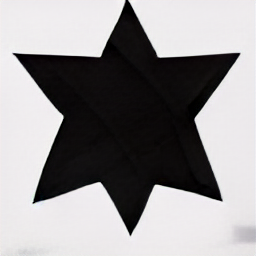

['white_star_on_blue_background', 'white_star_on_green_background', 'white_star_on_yellow_background', 'white_star_on_red_background', 'white_star_on_black_background']


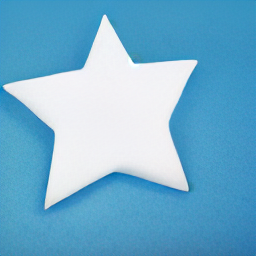

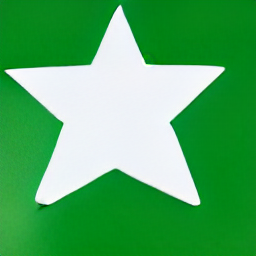

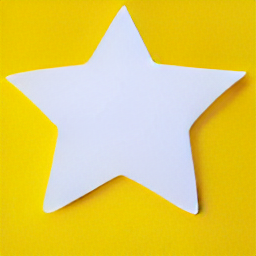

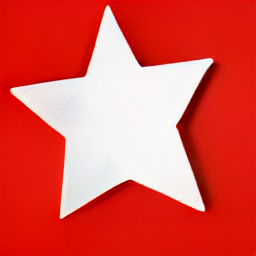

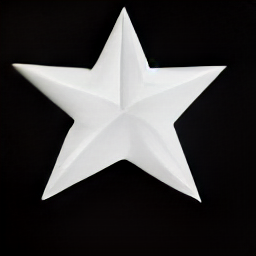

In [23]:
from flax.training.common_utils import shard_prng_key
import numpy as np
from PIL import Image
from tqdm.notebook import trange

# get paths for file names
paths = [i.replace(' ','_')for i in prompts]
paths = batch_paths(paths, 5)
print(paths)
print("path len ",len(paths))

# generate images
images = []
for i in trange(max(n_predictions // jax.device_count(), 1)):
    # get a new key
    key, subkey = jax.random.split(key)
    # generate images
    for k in range(36):
      batch = batches[k]
      new_paths = paths[k]
      print(new_paths)
      encoded_images = p_generate(
          batch,
          shard_prng_key(subkey),
          params,
          gen_top_k,
          gen_top_p,
          temperature,
          cond_scale,
      )
      # remove BOS
      encoded_images = encoded_images.sequences[..., 1:]
      # decode images
      decoded_images = p_decode(encoded_images, vqgan_params)
      decoded_images = decoded_images.clip(0.0, 1.0).reshape((-1, 256, 256, 3))
      for ind, decoded_img in enumerate(decoded_images):
          img = Image.fromarray(np.asarray(decoded_img * 255, dtype=np.uint8))
          images.append(img)
          display(img)
          # save images
          img.save('/content/drive/Shareddrives/CS 523 Project/DALLE/Test Images/{}'.format(new_paths[ind]), 'JPEG')

